# Calculating a Walkable Accessibility Score for Mexico City in Python 
Irene Farah  
2024  

Now we will use Python to apply our knowledge of spatial accessibility on a dataset of urban points of interest (POI) in Mexico City to create a 'Walkable Accessibility Score' (WAS).

This is done by computing the Euclidean distance between the centroids of Small Areas (demand units) for Mexico City and a pre-specified $k$ number of points of interest (POI) (supply sites) from the **open-source[ May of 2024, DENUE database](https://www.inegi.org.mx/contenidos/masiva/denue/denue_09_csv.zip)**. These POIs are then down-weighted based on distance from the census polygon AGEB (Basic Geostatistical Area) centroid according to a logistic distance decay function. In this notebook we include all amenities ($k$) and establish the $upper$ distance decay parameter as 400, to compare it with data from other cities within this repository (Dublin and US cities). We then join the chosen values back to the Small Area polygons and map them to observe spatial patterns in walkable accesisbility.

### 1. Install and load necessary libraries

In [1]:
# The !pip command installs Python packages directly though the Jupyter notebook interface
# Note: the !pip commands can be commented out once the packages have been properly installed on a specific machine
# !pip install matplotlib

In [2]:
# !pip install scikit-learn

In [3]:
# !pip install pandas

In [4]:
# !pip install geopandas

In [5]:
# !pip install scipy

In [6]:
# !pip install numpy

In [7]:
# !pip install mapclassify

In [8]:
# !conda install contextily --channel conda-forge

In [9]:
# !pip install folium

In [10]:
# !pip install branca

In [11]:
from matplotlib import colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

import contextily as cx
import folium
import branca.colormap as cm

# This command specifies that plots should occur within the notebook rather than as an export
%matplotlib inline 

/Users/irenefarah/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


We must specify the correct directory path to load some packages. In the code below, REPLACE 'ifarah' with your personal username. It should be shown in the output directories of the installed packages above.

In [12]:
import sys  
sys.path.insert(1, '/users/ifarah/appdata/roaming/python/python39/site-packages')
from sklearn.neighbors import BallTree
import geopandas as gpd
# import contextily as cx

### 2. Load data
Load the csv of POI data (with latitude and longitude coordinates) from the **tutorials** folder.

In [13]:
df = pd.read_csv('denue_09_csv/conjunto_de_datos/denue_inegi_09_.csv', sep=",", encoding='latin-1')

/var/folders/93/2tplx4tn2jdc1zgf9bm7hmfr0000gn/T/ipykernel_19839/4082821949.py:1: DtypeWarning: Columns (35) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('denue_09_csv/conjunto_de_datos/denue_inegi_09_.csv', sep=",", encoding='latin-1')


Check how large the dataset is and what information it contains.

In [14]:
"Your dataset contains " + str(len(df)) + " rows."

'Your dataset contains 476096 rows.'

In [15]:
sorted(list(df.columns.values.tolist()))

['ageb',
 'clee',
 'cod_postal',
 'codigo_act',
 'correoelec',
 'cve_ent',
 'cve_loc',
 'cve_mun',
 'edificio',
 'edificio_e',
 'entidad',
 'fecha_alta',
 'id',
 'latitud',
 'letra_ext',
 'letra_int',
 'localidad',
 'longitud',
 'manzana',
 'municipio',
 'nom_CenCom',
 'nom_estab',
 'nom_v_e_1',
 'nom_v_e_2',
 'nom_v_e_3',
 'nom_vial',
 'nomb_asent',
 'nombre_act',
 'num_local',
 'numero_ext',
 'numero_int',
 'per_ocu',
 'raz_social',
 'telefono',
 'tipoCenCom',
 'tipoUniEco',
 'tipo_asent',
 'tipo_v_e_1',
 'tipo_v_e_2',
 'tipo_v_e_3',
 'tipo_vial',
 'www']

In [16]:
pd.set_option('display.max_columns', None)

In [17]:
df.head()

,id,clee,nom_estab,raz_social,codigo_act,nombre_act,per_ocu,tipo_vial,nom_vial,tipo_v_e_1,nom_v_e_1,tipo_v_e_2,nom_v_e_2,tipo_v_e_3,nom_v_e_3,numero_ext,letra_ext,edificio,edificio_e,numero_int,letra_int,tipo_asent,nomb_asent,tipoCenCom,nom_CenCom,num_local,cod_postal,cve_ent,entidad,cve_mun,municipio,cve_loc,localidad,ageb,manzana,telefono,correoelec,www,tipoUniEco,latitud,longitud,fecha_alta
0,8441800,09014115111000012000000000U4,AGRO DESARROLLADORES NUTRICIONALES Y ESPECIALI...,AGRO DESARROLLADORES NUTRICIONALES Y ESPECIALI...,115111,Servicios de fumigación agrícola,6 a 10 personas,AVENIDA,INSURGENTES SUR,CIRCUITO,INTERIOR (AVENIDA RIO MIXCOAC),CALLE,CERES,CALLE,MINERVA,1524.0,NaN,CENTRO Y PLAZA COMERCIAL,23.0,NaN,NaN,COLONIA,CREDITO CONSTRUCTOR,CENTRO Y PLAZA COMERCIAL,PUNTA INSURGENTES,703,3940.0,9,Ciudad de México,14,Benito Juárez,1,Benito Juárez ...,0717,19,5578221074.0,AGRO.DESARROLLOS@GMAIL.COM,NaN,Fijo,19.366556,-99.181132,2019-11
1,7337437,09006115111000021000000000U1,ARCAM,NaN,115111,Servicios de fumigación agrícola,0 a 5 personas,CALLE,PLAYA ROSARITO,AVENIDA,SANTIAGO,CALLE,PLAYA MEXIQUILLO,CALLE,PLAYA MEXIQUILLO,32.0,NaN,NaN,NaN,NaN,NaN,BARRIO,BARRIO SANTIAGO,NaN,NaN,NaN,8820.0,9,Ciudad de México,6,Iztacalco,1,Iztacalco ...,0768,5,5513843251.0,ARCAMCONTROL@HOTMAIL.COM,NaN,Fijo,19.390029,-99.125241,2019-11
2,6314564,09012311921000011011000000U4,CAFETALERA TEPUZAPA,CAFETALERA TEPUZAPA SA DE CV,115119,Otros servicios relacionados con la agricultura,6 a 10 personas,CALLE,ALBORADA,CALLE,OASIS,CALLE,PLANICIE,CALLE,ALBORADA,105.0,NaN,NaN,NaN,NaN,NaN,COLONIA,PARQUES DEL PEDREGAL,NaN,NaN,NaN,14010.0,9,Ciudad de México,12,Tlalpan,1,Tlalpan ...,0074,14,NaN,TEPUZAPA@PRODIGY.NET.MX,NaN,Fijo,19.301701,-99.187652,2010-07
3,696550,09017115113000011001000000U5,COMERCIALIZADORA Y DISTRIBUIDORA DE VÍVERES,COMERCIALIZADORA DE VIVERES SA DE CV,115113,Beneficio de productos agrícolas,6 a 10 personas,CALLE,1,CALLE,ESTRONCIO,AVENIDA,PROLONGACION RIO CHURUBUSCO,CALLE,2,377.0,NaN,NaN,NaN,NaN,NaN,COLONIA,CUCHILLA PANTITLAN,NaN,NaN,NaN,15610.0,9,Ciudad de México,17,Venustiano Carranza,1,Venustiano Carranza ...,0884,18,5557013291.0,NaN,NaN,Fijo,19.422095,-99.067678,2014-12
4,930838,09008112512000021000000000U9,CRIADERO DE TRUCHAS,NaN,112512,"Piscicultura y otra acuicultura, excepto camar...",0 a 5 personas,CARRETERA,CAMINO A LOS DINAMOS,CARRETERA,DINAMO,CARRETERA,DINAMO,CARRETERA,DINAMO,0.0,SN,NaN,NaN,0.0,NaN,PARAJE,PRIMER DINAMO,NaN,NaN,NaN,10640.0,9,Ciudad de México,8,La Magdalena Contreras,81,Primer Dinamo ...,0368,800,NaN,NaN,NaN,Fijo,19.288889,-99.264444,2014-12


#### Filter the dataset by retail, banks, schools, parks, banks, and accomodation and food services according to the Standard Industrial Classification (SIC).

In [18]:
# Filter amenities data
four_digit_list = ['4611', '4620', '4631', '4641', '4651', '4661', '4671', '4681', '4699', '5221', '6111', '6112', '6119', '6121', '6122', '6129', '6131', '6132', '6139', '7210', '7221', '7223', '7120', '7131']
filtered_df = df[df['codigo_act'].astype(str).str[:4].isin(four_digit_list)]
filtered_df.head()

,id,clee,nom_estab,raz_social,codigo_act,nombre_act,per_ocu,tipo_vial,nom_vial,tipo_v_e_1,nom_v_e_1,tipo_v_e_2,nom_v_e_2,tipo_v_e_3,nom_v_e_3,numero_ext,letra_ext,edificio,edificio_e,numero_int,letra_int,tipo_asent,nomb_asent,tipoCenCom,nom_CenCom,num_local,cod_postal,cve_ent,entidad,cve_mun,municipio,cve_loc,localidad,ageb,manzana,telefono,correoelec,www,tipoUniEco,latitud,longitud,fecha_alta
54003,7737365,09007467111016671000000000U7,.CENTRAL DE TORNILLOS Y BIRLOS,NaN,467111,Comercio al por menor en ferreterías y tlapale...,0 a 5 personas,EJE VIAL,5 SUR (LEYES DE REFORMA),CALLE,11 DE ENERO DE 1861,CALLE,25 DE FEBRERO DE 1861,CALLE,BATALLA DE LOMA ALTA,64.0,B,NaN,NaN,NaN,NaN,COLONIA,LEYES DE REFORMA 3RA SECCION,NaN,NaN,NaN,9310.0,9,Ciudad de México,7,Iztapalapa,1,Iztapalapa ...,0411,18,NaN,NaN,NaN,Fijo,19.377028,-99.066396,2019-11
54006,6304360,09015463111006346001004471M5,000 - MODATELAS MATRIZ,MODATELAS SAPI DE CV,463111,Comercio al por menor de telas,31 a 50 personas,CALLE,PASEO DE LOS TAMARINDOS,CALLE,BOSQUE DE LOS TABACHINES,CALLE,PASEO DE LOS LAURELES,PRIVADA,BOSQUE DE RADIATAS,100.0,NaN,NaN,NaN,NaN,PLANTA BAJA,COLONIA,BOSQUE DE LAS LOMAS,EDIFICIO COMERCIAL Y DE SERVICIOS,ARCOS,1,5120.0,9,Ciudad de México,4,Cuajimalpa de Morelos,1,Cuajimalpa de Morelos ...,0195,5,NaN,TIENDAENLINEA@MODATELAS.COM.MX,WWW.MODATELAS.COM,Fijo,19.387666,-99.252378,2011-03
54007,658609,09017467115001101001000000S2,0060 MOCTEZUMA DOGO UN MUNDO DE LIMPIEZA,NaN,467115,Comercio al por menor de artículos para la lim...,6 a 10 personas,CALLE,EMILIO CARRANZA,AVENIDA,EMILIO CARRANZA,CALLE,ORIENTE 158,CALLE,ORIENTE 160,153.0,NaN,NaN,NaN,325.0,NaN,COLONIA,MOCTEZUMA 2A SECCION,NaN,NaN,NaN,15530.0,9,Ciudad de México,17,Venustiano Carranza,1,Venustiano Carranza ...,0653,3,5555829435.0,DOGOMOCTEZUMA1@GMAIL.COM,WWW.PRODUCTOS-DOGO.COM.MX,Fijo,19.430908,-99.099271,2010-07
54010,8117497,09005461140003241000000000U3,02 PRODUCTOS NATURISTAS,NaN,461140,Comercio al por menor de semillas y granos ali...,0 a 5 personas,CALLE,PONIENTE 122,CALLE,NORTE 19-A,CALLE,NORTE 21,CALLE,PONIENTE 126,NaN,SN,MERCADO PUBLICO,1.0,NaN,NaN,COLONIA,NUEVA VALLEJO,MERCADO PUBLICO,MERCADO 93 MAGDALENA DE LAS SALINAS,02,7750.0,9,Ciudad de México,5,Gustavo A. Madero,1,Gustavo A. Madero ...,1237,13,NaN,NaN,NaN,Fijo,19.484952,-99.148694,2019-11
54011,774758,09005461121003521000000000U8,03 CARNICERIA DE CARNES ROJAS SIN NOMBRE,NaN,461121,Comercio al por menor de carnes rojas,0 a 5 personas,CALLE,PONIENTE 122,CALLE,NORTE 19-A,CALLE,NORTE 21,CALLE,PONIENTE 126,NaN,SN,MERCADO PUBLICO,1.0,NaN,NaN,COLONIA,NUEVA VALLEJO,MERCADO PUBLICO,MERCADO 93 MAGDALENA DE LAS SALINAS,3,7750.0,9,Ciudad de México,5,Gustavo A. Madero,1,Gustavo A. Madero ...,1237,13,NaN,NaN,NaN,Fijo,19.484952,-99.148694,2010-07


#### Create weights, if needed

In [19]:
# Mapping values (you can change the assignments as needed)
# Function to assign weights with a default of 1
def assign_weights(type, mapping=None):
    if mapping is None:
        mapping = {}  # Default to empty dict
    return mapping.get(type, 1)  # Return mapped value or default to 1

In [20]:
#Check the type and vallues of codigo_act
print(type(filtered_df['codigo_act'].iloc[0]))
print(filtered_df['codigo_act'].unique())

<class 'numpy.int64'>
[467111 463111 467115 461140 461121 467113 461110 461190 464121 461150
 466112 465112 461130 461170 467112 466111 464113 461123 461160 463112
 466114 461122 465111 463113 464111 464112 467114 468111 464122 467117
 468112 467116 466113 522110 611162 611122 611171 611111 611211 611181
 611112 611121 611131 611161 611132 611182 611172 611151 611212 611141
 611142 611152 713120 713113 713112 713111 713114 722310 722330 722320]


In [21]:
# Example. Change codigo_act according to whatever your type of destination values are. In our case, amenities.
filtered_df['codigo_act'] = filtered_df['codigo_act'].astype(int)  # Ensure integer type or whatever your category is

# Example mapping for different types of weights
#mapping = {467111: 1, 463111: 2, 467115: 0.5, 461140: 2, 461121:1,
#           467113:2, 461130: 0.5, 461122: 2, 722320:1, 611152:2} 
mapping = {} # Defaults the weights to 1

filtered_df['types_weights'] = filtered_df['codigo_act'].apply(lambda x: assign_weights(x, mapping))

/var/folders/93/2tplx4tn2jdc1zgf9bm7hmfr0000gn/T/ipykernel_19839/88969893.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['codigo_act'] = filtered_df['codigo_act'].astype(int)  # Ensure integer type or whatever your category is
/var/folders/93/2tplx4tn2jdc1zgf9bm7hmfr0000gn/T/ipykernel_19839/88969893.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['types_weights'] = filtered_df['codigo_act'].apply(lambda x: assign_weights(x, mapping))


In [22]:
filtered_df.head(3)

,id,clee,nom_estab,raz_social,codigo_act,nombre_act,per_ocu,tipo_vial,nom_vial,tipo_v_e_1,nom_v_e_1,tipo_v_e_2,nom_v_e_2,tipo_v_e_3,nom_v_e_3,numero_ext,letra_ext,edificio,edificio_e,numero_int,letra_int,tipo_asent,nomb_asent,tipoCenCom,nom_CenCom,num_local,cod_postal,cve_ent,entidad,cve_mun,municipio,cve_loc,localidad,ageb,manzana,telefono,correoelec,www,tipoUniEco,latitud,longitud,fecha_alta,types_weights
54003,7737365,09007467111016671000000000U7,.CENTRAL DE TORNILLOS Y BIRLOS,NaN,467111,Comercio al por menor en ferreterías y tlapale...,0 a 5 personas,EJE VIAL,5 SUR (LEYES DE REFORMA),CALLE,11 DE ENERO DE 1861,CALLE,25 DE FEBRERO DE 1861,CALLE,BATALLA DE LOMA ALTA,64.0,B,NaN,NaN,NaN,NaN,COLONIA,LEYES DE REFORMA 3RA SECCION,NaN,NaN,NaN,9310.0,9,Ciudad de México,7,Iztapalapa,1,Iztapalapa ...,0411,18,NaN,NaN,NaN,Fijo,19.377028,-99.066396,2019-11,1
54006,6304360,09015463111006346001004471M5,000 - MODATELAS MATRIZ,MODATELAS SAPI DE CV,463111,Comercio al por menor de telas,31 a 50 personas,CALLE,PASEO DE LOS TAMARINDOS,CALLE,BOSQUE DE LOS TABACHINES,CALLE,PASEO DE LOS LAURELES,PRIVADA,BOSQUE DE RADIATAS,100.0,NaN,NaN,NaN,NaN,PLANTA BAJA,COLONIA,BOSQUE DE LAS LOMAS,EDIFICIO COMERCIAL Y DE SERVICIOS,ARCOS,1,5120.0,9,Ciudad de México,4,Cuajimalpa de Morelos,1,Cuajimalpa de Morelos ...,0195,5,NaN,TIENDAENLINEA@MODATELAS.COM.MX,WWW.MODATELAS.COM,Fijo,19.387666,-99.252378,2011-03,1
54007,658609,09017467115001101001000000S2,0060 MOCTEZUMA DOGO UN MUNDO DE LIMPIEZA,NaN,467115,Comercio al por menor de artículos para la lim...,6 a 10 personas,CALLE,EMILIO CARRANZA,AVENIDA,EMILIO CARRANZA,CALLE,ORIENTE 158,CALLE,ORIENTE 160,153.0,NaN,NaN,NaN,325.0,NaN,COLONIA,MOCTEZUMA 2A SECCION,NaN,NaN,NaN,15530.0,9,Ciudad de México,17,Venustiano Carranza,1,Venustiano Carranza ...,0653,3,5555829435.0,DOGOMOCTEZUMA1@GMAIL.COM,WWW.PRODUCTOS-DOGO.COM.MX,Fijo,19.430908,-99.099271,2010-07,1


Create a GeoDataFrame (which is a spatial data type for use within Python) from the  latitude and longitude coordinates within the `denue_inegi_09_` csv.

In [23]:
gdf = gpd.GeoDataFrame(
    filtered_df,
    geometry=gpd.points_from_xy(filtered_df.longitud, filtered_df.latitud),
    crs='epsg:4326') # epsg specifies the projection

# Change the Coordinate Reference System (CRS)
# Check for different projections here: https://epsg.io/
gdf = gdf.to_crs('epsg:6362')

In [24]:
"Your dataset contains " + str(len(gdf)) + " rows."

'Your dataset contains 140911 rows.'

Check that the CRS actually changed.

In [25]:
gdf.crs

<Projected CRS: EPSG:6362>
Name: Mexico ITRF92 / LCC
Axis Info [cartesian]:
- N[north]: Northing (metre)
- E[east]: Easting (metre)
Area of Use:
- name: Mexico - onshore and offshore.
- bounds: (-122.19, 12.1, -84.64, 32.72)
Coordinate Operation:
- name: Mexico LCC
- method: Lambert Conic Conformal (2SP)
Datum: Mexico ITRF92
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

Make sure that the geometry for each row has a value.

In [26]:
gdf = gdf[~gdf.is_empty]

In [27]:
"Your dataset contains " + str(len(gdf)) + " rows."

'Your dataset contains 140911 rows.'

Add an `ID` column to the GeoDataFrame and create a new GeoDataFrame that contains only the `ID` and `geometry` columns (`am_id`).

In [28]:
gdf["ID"] = gdf.index

am_id = gdf[['geometry', 'types_weights']]
am_id.head(3)

,geometry,types_weights
54003,POINT (2807282.440 823066.360),1
54006,POINT (2787781.568 823854.461),1
54007,POINT (2803719.120 828942.284),1


Load the Small Area shapefile for the demand units from the **tutorial** folder. We will then change the Coordinate Reference System (CRS) to Mexico's Lambert Conic Conformal projection to match the POI file and add a new `ID` column.

In [29]:
s_v = gpd.read_file('ageb_mxcity/09a.shp') # Load geography (oftentimes as shapefile).

s_v = s_v.set_crs('epsg:6362', allow_override=True) # Set the Coordinate Reference System
s_v.rename(columns={'CVEGEO': 'ID'}, inplace=True) # Rename the columns for convenience

In [30]:
s_v.head()

,ID,CVE_ENT,CVE_MUN,CVE_LOC,CVE_AGEB,geometry
0,0901000011716,09,010,0001,1716,"POLYGON ((2787237.541 816989.461, 2787288.728 ..."
1,0901000012150,09,010,0001,2150,"POLYGON ((2794154.458 823013.444, 2794155.774 ..."
2,0901000011133,09,010,0001,1133,"POLYGON ((2795690.723 820050.788, 2795684.238 ..."
3,0901000011307,09,010,0001,1307,"POLYGON ((2792584.475 815678.668, 2792624.325 ..."
4,0901000010281,09,010,0001,0281,"POLYGON ((2788845.392 823526.074, 2788840.549 ..."


Now we will extract the centroids of the polygons, which we will use to calculate distance to the $k-$ nearest POIs, and replace the `geometry` column in the `s_v` GeoDataFrame with the centroids of each Small Area. This effectively transforms the polygon GeoDataFrame to a points file.

In [31]:
s_v['geometry'] = s_v.centroid

# Check that the geometry is indeed in point form
s_v[['geometry']].head(3)

,geometry
0,POINT (2787091.708 816590.463)
1,POINT (2793986.972 823047.548)
2,POINT (2794967.016 819439.549)


### 3. Build the functions for calculating the access score

Now we'll create the necessary functions for calculating the access score itself. This next cell creates a function called `get_nearest_neighbors` that takes as input a source GeoDataFrame (origins) and a candidates GeoDataFrame (destination) and a specified $k$ number of nearest neighbours. The function then calculates Euclidean distance from each source to each of the $k-$ nearest neighbours using the `BallTree` function from the `scikit-learn` library.

In [32]:
# This cell is creating a function for eastimating nearest neighbors from point to point.
def get_nearest_neighbors(gdf1, gdf2, k_neighbors=2):
    '''Find k nearest neighbors for all source points from a set of candidate points
    modified from: https://automating-gis-processes.github.io/site/notebooks/L3/nearest-neighbor-faster.html    
    Parameters
    ----------
    gdf1 : geopandas.DataFrame
    Geometries to search from.
    gdf2 : geopandas.DataFrame
    Geoemtries to be searched.
    k_neighbors : int, optional
    Number of nearest neighbors. The default is 2.
    Returns
    -------
    gdf_final : geopandas.DataFrame
    gdf1 with distance, index and all other columns from gdf2.'''

    src_points = [(x,y) for x,y in zip(gdf1.geometry.x , gdf1.geometry.y)]
    candidates =  [(x,y) for x,y in zip(gdf2.geometry.x , gdf2.geometry.y)]

    # Create tree from the candidate points
    tree = BallTree(candidates, leaf_size=15, metric='euclidean')

    # Find closest points and distances
    distances, indices = tree.query(src_points, k=k_neighbors)

    # Transpose to get distances and indices into arrays
    distances = distances.transpose()
    indices = indices.transpose()

    closest_gdfs = []
    for k in np.arange(k_neighbors):
        gdf_new = gdf2.iloc[indices[k]].reset_index()
        gdf_new['distance'] =  distances[k]
        gdf_new = gdf_new.add_suffix(f'_{k+1}')
        closest_gdfs.append(gdf_new)
    
    closest_gdfs.insert(0,gdf1)    
    gdf_final = pd.concat(closest_gdfs,axis=1)

    return gdf_final

Next, the function `clean_dataframe` reshapes the output from `get_nearest_neighbors` from 'wide' to 'long' format and renames some of the columns in a consistent way. This is necessary to simplify the calculation of the distance decay function - in essence, `get_nearest_neighbors` outputs a DataFrame where each row corresponds to an origin point, and each of the $k$ destinations are marked as separate columns - each with its own corresponding column for `distance`, `index` (ID), and its own `geometry`. This is 'wide' format and means that for $k=10$ nearest-neighbours, 30 additional columns will be added to the DataFrame (and 150 for $k=50$, etc.). In 'long' format, the data structure is simplified by adding a row for each *destination* (thus increasing the number of rows) which allows us to maintain only one column for `origin` (index of the origin), `dest` (index of the destination), `euclidean` (distance between the two), and `neighbor` (what rank $k$ it is).

In [33]:
def clean_dataframe(df):
    # Create the ID2 column
    df["ID2"] = df.index

    # Reshape the dataframe from wide to long format using the provided suffix
    long_df = pd.wide_to_long(df, stubnames=["distance_", "index_", "geometry_", "types_weights_"], i="ID2", j="neighbor") #Irene

    # Rename columns
    long_df.loc[:, 'origin'] = long_df['ID']
    long_df.loc[:, 'dest'] = long_df['index_']
    long_df.loc[:, 'euclidean'] = long_df['distance_']
    long_df.loc[:, 'weights'] = long_df['types_weights_'] 

    # Reset index and keep necessary columns
    long_df = long_df.reset_index(level="neighbor")
    cost_df = long_df[['euclidean', 'origin', 'dest', 'neighbor', 'weights']] 

    # Sort the dataframe by origin and euclidean distance
    cost_df.sort_values(by=['origin', 'euclidean'], inplace=True)

    return cost_df

The last function `acces_measure` calculates the distance decay weights for each destination based on the long-format DataFrame. It starts by converting the Euclidean distance into a travel time (based on a flat assumption of 5 kph walking speed), and then applies a logistic distance decay function to calculate the value `LogitT_5`. The function takes two primary inputs: `upper` determines the 'intercept' (i.e., minimum and maximum thresholds) of the function, which larger values corresponding to larger thresholds, and `decay` determines the slope of the function.

In [34]:
def access_measure(df_cost, df_sv, upper, decay):
    # Calculate time from euclidean distance
    # https://journals-sagepub-com.may.idm.oclc.org/doi/10.1177/0265813516641685
    df_cost['time'] = (df_cost['euclidean'] * 3600) / 5000  # convert distance into time (rate of 5kph)
    
    # Calculate LogitT_5 using the provided formula
    df_cost['LogitT_5'] = 1 - (1 / (np.exp((upper / 180) - decay * df_cost['time']) + 1))
    
    # Apply weights to the accessibility score
    df_cost['weighted_access'] = df_cost['LogitT_5'] * df_cost['weights']
    
    # Sum weighted distances by tract (origin) ID
    cost_sum = df_cost.groupby("origin").sum()
    cost_sum['ID'] = cost_sum.index
    
    # Merge with the corresponding smaller sv original dataframe
    cost_merge = df_sv.merge(cost_sum, how='inner', on='ID')
    
    # If you wan’t do standarize the score, you can include code here
    return cost_merge

### 4. Run the `get_nearest_neighbors` function for $k = $ 150 nearest neighbors and clean the data

In this practical we will use the parameters of $k$ = 500 and `upper` = 400. However, you can change it to whichever parameters you believe are more accurate for your purposes. First, we have to calculate the nearest neighbors.

In [35]:
#For 150 NN
closest150 = get_nearest_neighbors(s_v, am_id, k_neighbors=150)

Then we will clean the dataframes by converting them from wide to long format. This bit of code takes the longest to run in the notebook.

In [36]:
cost150 = clean_dataframe(closest150)

/Users/irenefarah/Library/Python/3.9/lib/python/site-packages/geopandas/geodataframe.py:1528: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
/var/folders/93/2tplx4tn2jdc1zgf9bm7hmfr0000gn/T/ipykernel_19839/4158407426.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cost_df.sort_values(by=['origin', 'euclidean'], inplace=True)


### 5. Estimate the access metric using the logistic decay function

Now we are ready to calculate the access score based on  $k$ = 150 and `upper` = 400. In this case we will hold `decay` constant (0.008), but this could also be tweaked if desired.

In [37]:
result150_400 = access_measure(cost150, s_v, upper=400, decay=.008)

### 6. Mapping the results

We'll start by mapping all of the Small Area centroids (in blue) and POIs (in orange) so that we can get a general sense for the overall spatial layout of the data. This is easily done by using the `matplotlib` command `plot` specifying a particular figure size. When a second plot is called in the same cell, it simply plots on top of the initial plot. For the second set of points, we also specify the marker size and colour.

<Axes: >

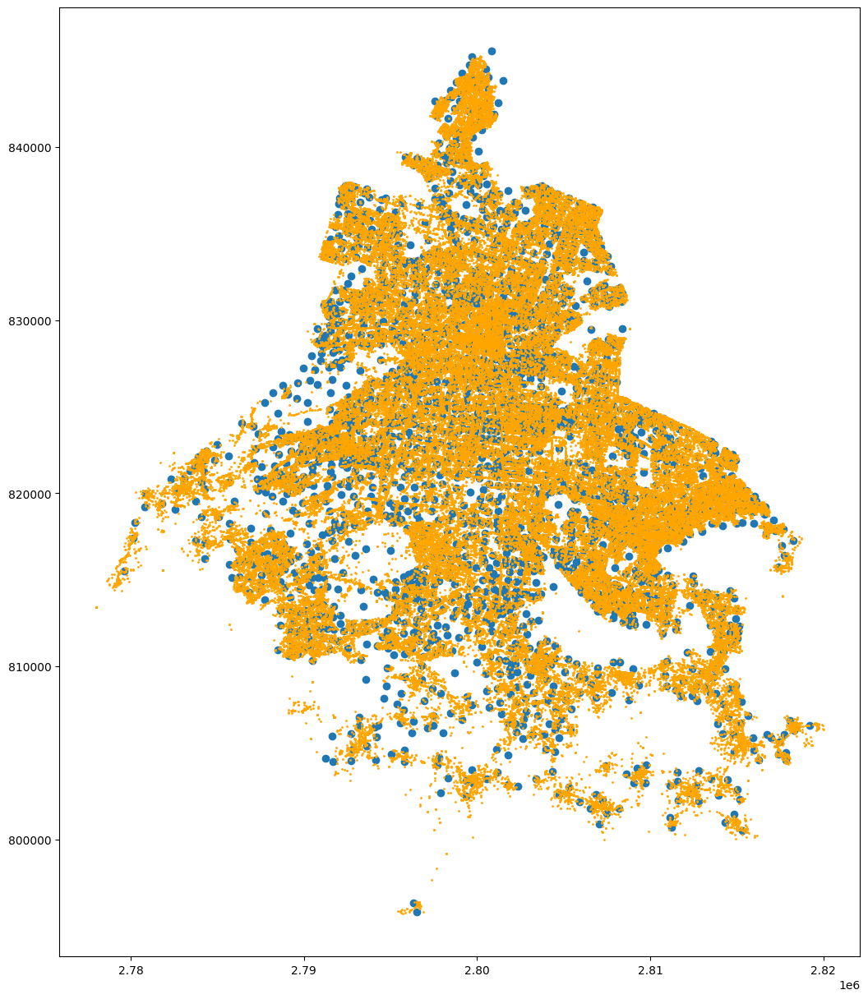

In [38]:
#Plot SAs and POIs (in orange) 
base = s_v.plot(figsize=(15,15))
am_id.plot(ax=base, color='orange', markersize = 1, figsize=(15,15))

Now, let's map the final results. Our comparative analysis above indicates that $k=150$ and `upper` = 400 provide the highest correlation with observed walking commute data from the Census (0.558). We will choose that DataFrame (`result150_400`) and merge it with the polygon Small Area GeoDataFrame so that we can map it.

In [39]:
s_v2 = gpd.read_file('ageb_mxcity/09a.shp') # Re-load polygon geography
s_v2 = s_v2.set_crs('epsg:6362', allow_override=True) # Set the Coordinate Reference System
s_v2.rename(columns={'CVEGEO': 'ID'}, inplace=True) # Rename the columns for convenience

In [40]:
result150_400 = result150_400[['ID', 'LogitT_5']]
s_v2 = s_v2.merge(result150_400, how='inner', on='ID') # Inner join

This final bit of code specifies how to plot a choropleth map in `matplotlib`. First, we specify that we will draw multiple plots (i.e., the legend, title, etc.) in one figure. Then we use the `to_crs` command to set the Coordinate Reference System and `plot` to draw in the choropleth data. You can see how we specified the 'viridis' [colour ramp](https://matplotlib.org/stable/users/explain/colors/colormaps.html) for `cmap`, white polygon boundaries, and a transparency value (`alpha`) of 0.5. We also removed the coordinate axes from the plot, add a title, and *can* add a [basemap](https://contextily.readthedocs.io/en/latest/intro_guide.html) (from Carto, a basemap called [Positron](https://carto.com/blog/positron-dark-matter-new-look)) by removing the comment `#` from the last line of code (and commenting out the line above, `# plt.show()`. However, due to the difficult installation setup in the lab, for this exercise we have not installed the required `contextily` package. 

**Note:** We could also set a particular classification scheme (e.g., equal interval) and the number of classification breaks if we had installed the `mapclassify` package by adding these items to a line of code like this: `s_v2.to_crs('EPSG:6362').plot(ax=ax, column='LogitT_5', legend=True, cmap='viridis', edgecolor='white', scheme='equalinterval', k=10, alpha=.5)`. However, installing `mapclassify` requires an older verison of `numpy` that may cause trouble for other package dependencies, so we will skip that here.

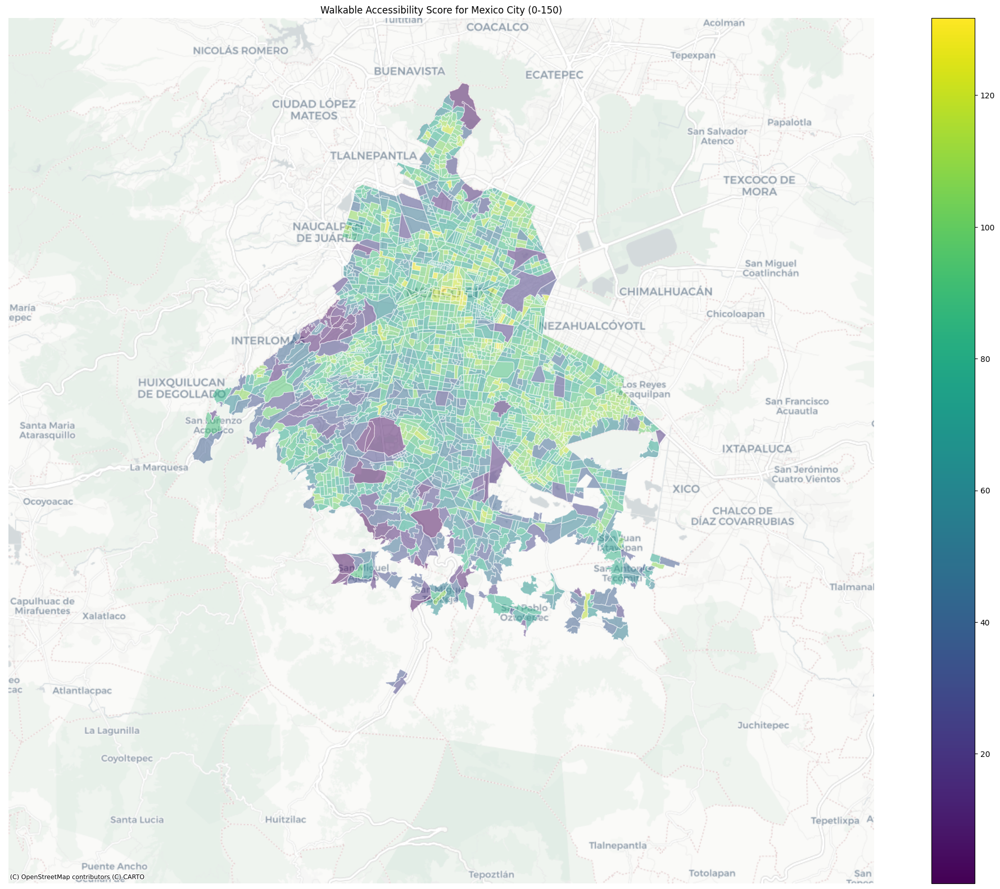

In [41]:
# Assuming s_v2 is a GeoDataFrame
# Reproject s_v2 to EPSG:3857 (Web Mercator) to match the basemap
s_v2 = s_v2.to_crs('EPSG:3857')

# Create the plot
f, ax = plt.subplots(1, figsize=(25, 20))
s_v2.plot(ax=ax, column='LogitT_5', legend=True, cmap='viridis', edgecolor='white', alpha=0.5)

# Add a basemap using contextily
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)  # You can choose other basemaps, e.g., OpenStreetMap, Stamen Terrain

# Remove axes and add title
ax.set_axis_off()
ax.set_title('Walkable Accessibility Score for Mexico City (0-150)')
plt.axis('equal')  # Set x and y axes to be equal size
plt.show()

### Create an interactive map!

In [42]:
# Reproject to EPSG:4326 (WGS 84) for Folium compatibility
s_v2 = s_v2.to_crs(epsg=4326)

# Create a color map using 'viridis' from branca for the LogitT_5 column
min_value = s_v2['LogitT_5'].min()
max_value = s_v2['LogitT_5'].max()
colormap = cm.linear.YlOrRd_09.scale(min_value, max_value)


# Initialize the map, centering on the data
map_center = [s_v2.centroid.y.mean(), s_v2.centroid.x.mean()]


m = folium.Map(location=map_center, zoom_start=12)

folium.GeoJson(
    s_v2,
    style_function=lambda feature: {
        'fillColor': colormap(feature['properties']['LogitT_5']),
        'color': 'white',
        'weight': 1,
        'fillOpacity': 0.6,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['LogitT_5'],
        aliases=['Accessibility Score:'],
        localize=True
    )
).add_to(m)

# Add the colormap legend to the map
colormap.caption = 'Walkable Accessibility Score (LogitT_5)'
colormap.add_to(m)

# Display the map in the Jupyter Notebook
m

/var/folders/93/2tplx4tn2jdc1zgf9bm7hmfr0000gn/T/ipykernel_19839/3463818435.py:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  map_center = [s_v2.centroid.y.mean(), s_v2.centroid.x.mean()]


Finally, we can also export the data as a csv to join to the Small Area shapefile in other GIS software.

In [43]:
result150_400.head()

,ID,LogitT_5
0,0901000011716,94.687308
1,0901000012150,98.927519
2,0901000011133,61.007293
3,0901000011307,41.935287
4,0901000010281,57.809158


In [44]:
# Export as a csv if needed.
result150_400.to_csv('mxcity_result150_400.csv')